In [71]:
import numpy as np
import matplotlib.cm as cm
from matplotlib import ticker
#import itertools
import math
import scipy
from scipy import spatial
import matplotlib.pyplot as plt
import matplotlib
#import matplotlib.patches as patches
#from matplotlib import animation
#from matplotlib import transforms
#from mpl_toolkits.axes_grid1 import make_axes_locatable
import xarray as xr
import dask
#from sklearn.cluster import KMeans
#from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import KDTree
#import pandas as pd
import netCDF4
#import matplotlib.image as imag
#from sklearn.cluster import MiniBatchKMeans
#from sklearn.decomposition import PCA,IncrementalPCA
#from yellowbrick.cluster import KElbowVisualizer
#from matplotlib import ticker
#import cartopy
#import cartopy.feature as cfeature
#import cartopy.crs as ccrs
#from mpl_toolkits.basemap import Basemap
#from statistics import mode
#from scipy.ndimage.filters import uniform_filter1d
#from sklearn.utils import shuffle
#from scipy.stats import norm
#from mpl_toolkits.mplot3d import Axes3D

#import matplotlib.cm as cm
#import warnings
#warnings.filterwarnings("ignore")
#from matplotlib.axes._axes import _log as matplotlib_axes_logger
#matplotlib_axes_logger.setLevel('ERROR')

In [72]:
fz = 15*1.5
lw = 4
siz = 100
XNNA = 1.25 # Abscissa where architecture-constrained network will be placed
XTEXT = 0.25 # Text placement
YTEXT = 0.3 # Text placement

plt.rc('text', usetex=False)
matplotlib.rcParams['mathtext.fontset'] = 'stix'
matplotlib.rcParams['font.family'] = 'STIXGeneral'
#mpl.rcParams["font.serif"] = "STIX"
plt.rc('font', family='serif', size=fz)
matplotlib.rcParams['lines.linewidth'] = lw

In [73]:
others = netCDF4.Dataset("/fast/gmooers/Raw_Data/extras/TimestepOutput_Neuralnet_SPCAM_216.cam.h1.2009-01-01-00000.nc")
levs = np.array(others.variables['lev'])
lons = np.array(others.variables['lon'])
new = np.flip(levs)
crms = np.arange(1,129,1)
Xs, Zs = np.meshgrid(crms, new)

In [74]:
z_test_tsne_track = np.load("/fast/gmooers/gmooers_git/CBRAIN-CAM/MAPS/Synoptic_Latent_Spaces/Full_Trackable_2D_PCA_Latent_Space__31.npy")
z_test_tsne_amazon = np.load("/fast/gmooers/gmooers_git/CBRAIN-CAM/MAPS/Synoptic_Latent_Spaces/Full_3_Months_Amazon_2D_PCA_Latent_Space__31.npy")
z_test_tsne_ocean = np.load("/fast/gmooers/gmooers_git/CBRAIN-CAM/MAPS/Synoptic_Latent_Spaces/Full_3_Months_Atlantic_2D_PCA_Latent_Space__31.npy")


Test_Images = np.load("/fast/gmooers/Preprocessed_Data/W_Variable/Trackable_Space_Time_W_Test.npy")
Ocean_Test_Images = np.load("/fast/gmooers/Preprocessed_Data/Single_Amazon_Unaveraged/test_atlantic_all.npy")
Amazon_Test_Images = np.load("/fast/gmooers/Preprocessed_Data/Single_Amazon_Unaveraged/test_amazon_all.npy")

Max_Scalar = np.load("/fast/gmooers/Preprocessed_Data/Centered_50_50/Space_Time_Max_Scalar.npy")
Min_Scalar = np.load("/fast/gmooers/Preprocessed_Data/Centered_50_50/Space_Time_Min_Scalar.npy")

Test_Images = np.interp(Test_Images, (0, 1), (Min_Scalar, Max_Scalar))
Ocean_Test_Images = np.interp(Ocean_Test_Images, (0, 1), (Min_Scalar, Max_Scalar))
Amazon_Test_Images = np.interp(Amazon_Test_Images, (0, 1), (Min_Scalar, Max_Scalar))

In [75]:
W_0 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-1,:])), axis=1)
W_1 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-2,:])), axis=1)
W_2 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-3,:])), axis=1)
W_3 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-4,:])), axis=1)
W_4 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-5,:])), axis=1)
W_5 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-6,:])), axis=1)
W_6 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-7,:])), axis=1)
W_7 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-8,:])), axis=1)
W_8 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-9,:])), axis=1)
W_9 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-10,:])), axis=1)
W_10 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-11,:])), axis=1)
W_11 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-12,:])), axis=1)
W_12 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-13,:])), axis=1)
W_13 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-14,:])), axis=1)
W_14 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-15,:])), axis=1)
W_15 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-16,:])), axis=1)
W_16 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-17,:])), axis=1)
W_17 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-18,:])), axis=1)
W_18 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-19,:])), axis=1)
W_19 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-20,:])), axis=1)
W_20 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-21,:])), axis=1)
W_21 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-22,:])), axis=1)
W_22 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-23,:])), axis=1)
W_23 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-24,:])), axis=1)
W_24 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-25,:])), axis=1)
W_25 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-26,:])), axis=1)
W_26 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-27,:])), axis=1)
W_27 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-28,:])), axis=1)
W_28 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-29,:])), axis=1)
W_29 = np.nanmean(np.abs(np.squeeze(Test_Images[:,-30,:])), axis=1)

-0.6504535299077886
0.024742013345592888


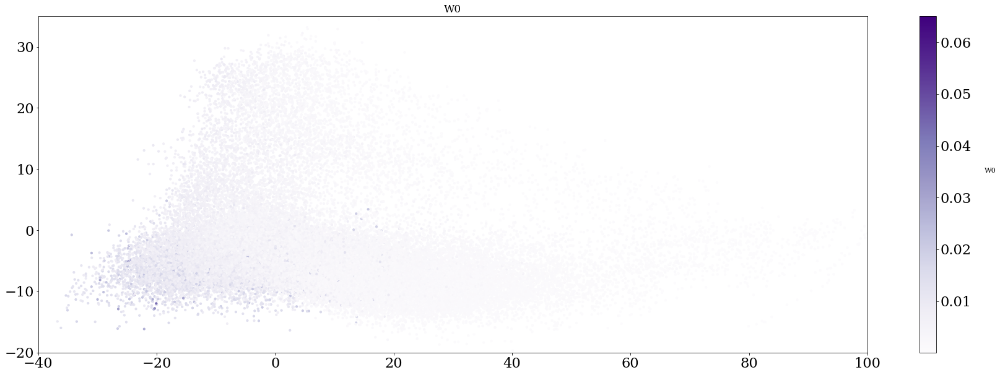

In [76]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_0, cmap="Purples", s=10.0)
ax.set_title("W0", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W0", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_0)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_0)[0])

In [ ]:
quintiles = np.percentile(W_0, [20,40,60,80])
out = np.searchsorted(quintiles,W_0)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W0 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.6716213028351466
0.03855688094159455


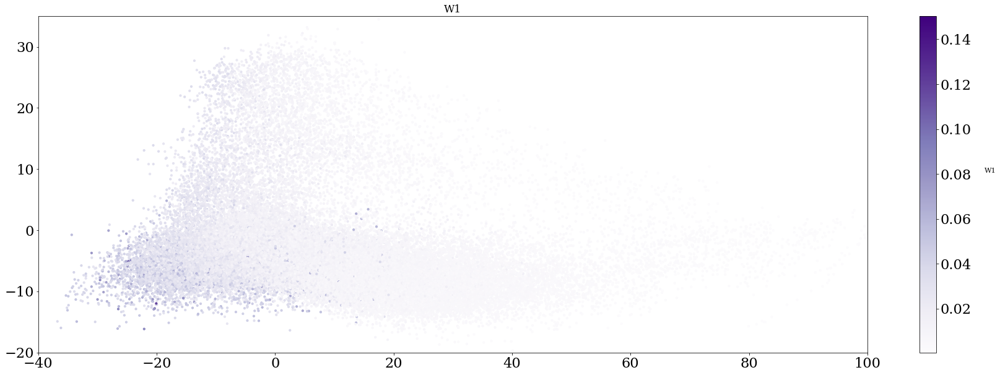

In [77]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_1, cmap="Purples", s=10.0)
ax.set_title("W1", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W1", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_1)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_1)[0])

In [ ]:
quintiles = np.percentile(W_1, [20,40,60,80])
out = np.searchsorted(quintiles,W_1)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W1 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.6705662168096886
0.028136798763281425


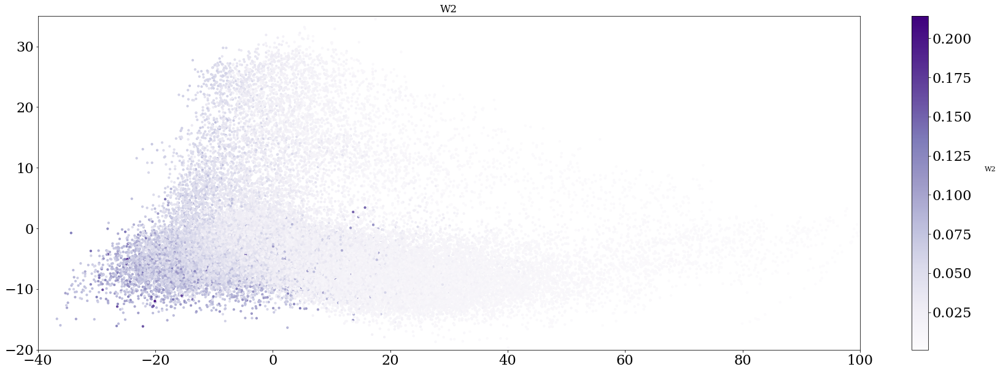

In [78]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_2, cmap="Purples", s=10.0)
ax.set_title("W2", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W2", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_2)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_2)[0])

In [ ]:
quintiles = np.percentile(W_2, [20,40,60,80])
out = np.searchsorted(quintiles,W_2)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W2 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.6696179423607043
0.003931841080092823


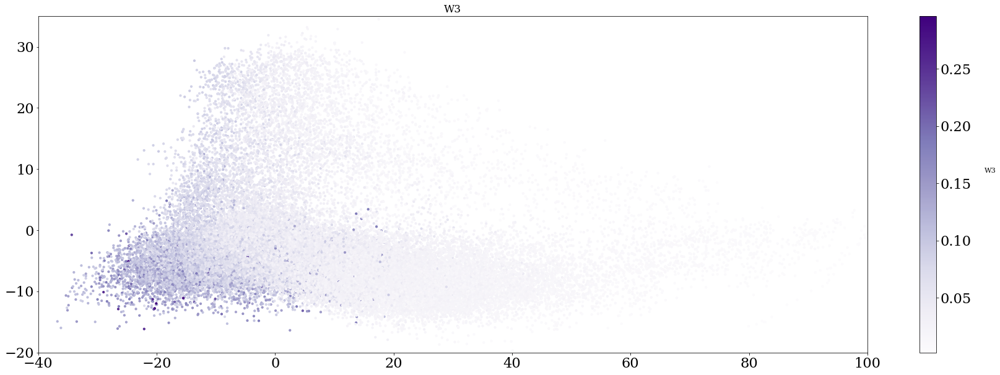

In [79]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_3, cmap="Purples", s=10.0)
ax.set_title("W3", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W3", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_3)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_3)[0])

In [ ]:
quintiles = np.percentile(W_3, [20,40,60,80])
out = np.searchsorted(quintiles,W_3)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W3 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.6688999234137281
-0.02996810031505303


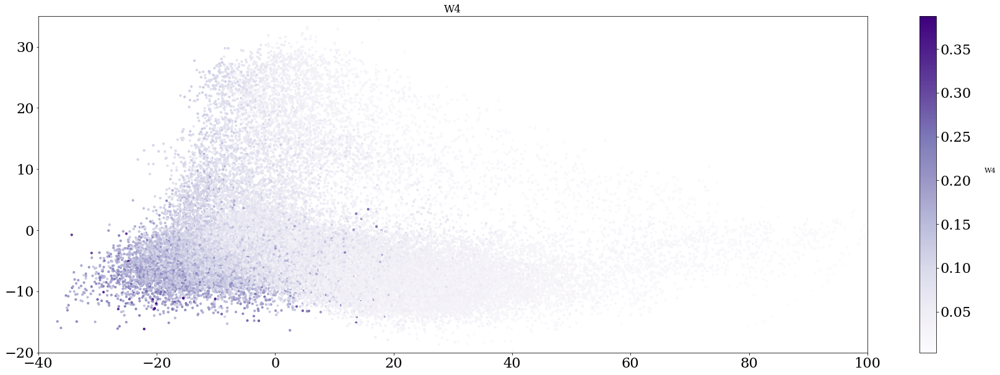

In [80]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_4, cmap="Purples", s=10.0)
ax.set_title("W4", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W4", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_4)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_4)[0])

In [ ]:
quintiles = np.percentile(W_4, [20,40,60,80])
out = np.searchsorted(quintiles,W_4)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W4 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.6765474021042802
-0.017570168027363817


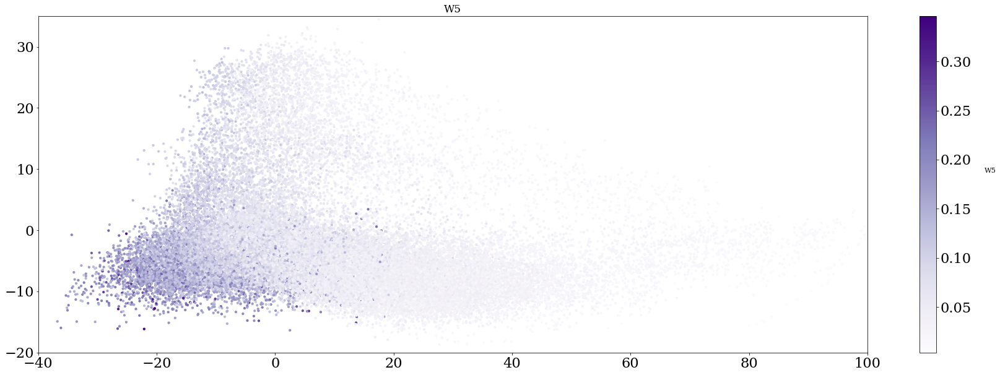

In [81]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_5, cmap="Purples", s=10.0)
ax.set_title("W5", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W5", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_5)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_5)[0])

In [ ]:
quintiles = np.percentile(W_5, [20,40,60,80])
out = np.searchsorted(quintiles,W_5)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W5 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.694171338432751
0.012558501714788771


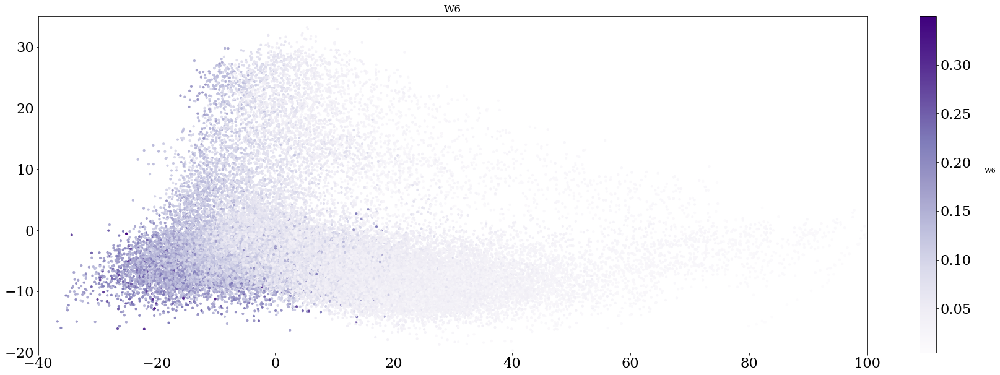

In [82]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_6, cmap="Purples", s=10.0)
ax.set_title("W6", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W6", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_6)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_6)[0])

In [ ]:
quintiles = np.percentile(W_6, [20,40,60,80])
out = np.searchsorted(quintiles,W_6)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W6 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.6786081893651421
0.03243202483964502


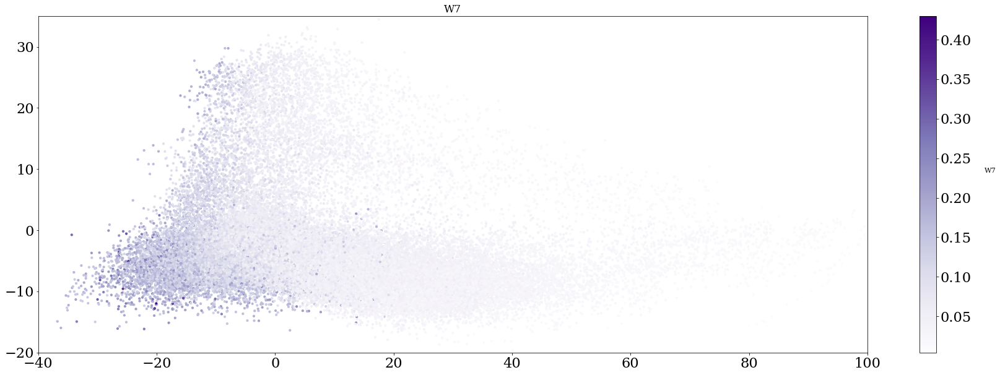

In [83]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_7, cmap="Purples", s=10.0)
ax.set_title("W7", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W7", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_7)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_7)[0])

In [ ]:
quintiles = np.percentile(W_7, [20,40,60,80])
out = np.searchsorted(quintiles,W_7)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W7 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.6766238639951991
0.010271717277725466


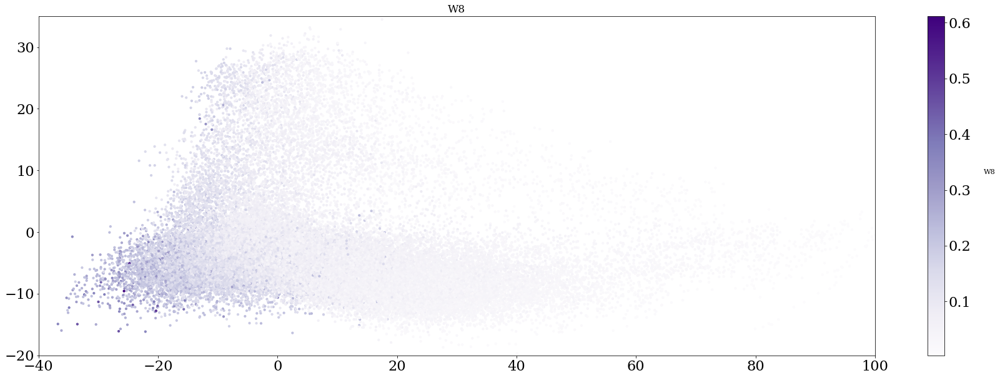

In [84]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_8, cmap="Purples", s=10.0)
ax.set_title("W8", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W8", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_8)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_8)[0])

In [ ]:
quintiles = np.percentile(W_8, [20,40,60,80])
out = np.searchsorted(quintiles,W_8)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W8 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.6506091226830958
-0.011632834044953204


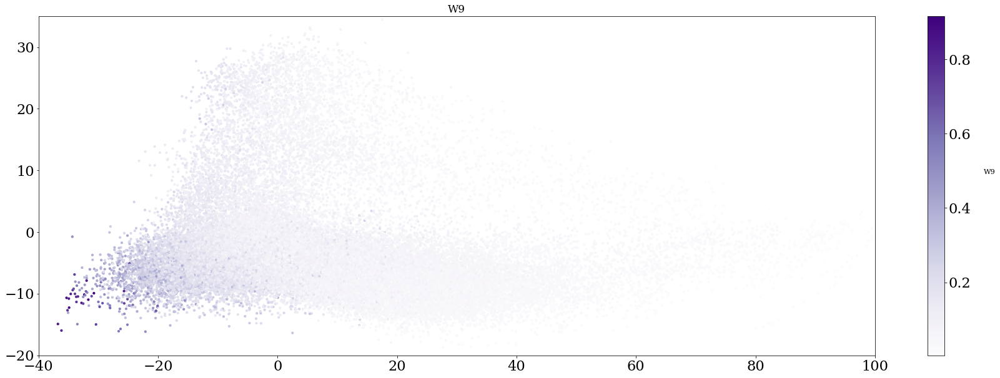

In [85]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_9, cmap="Purples", s=10.0)
ax.set_title("W9", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W9", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_9)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_9)[0])

In [ ]:
quintiles = np.percentile(W_9, [20,40,60,80])
out = np.searchsorted(quintiles,W_9)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W9 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.6379771309452426
-0.00834105224917614


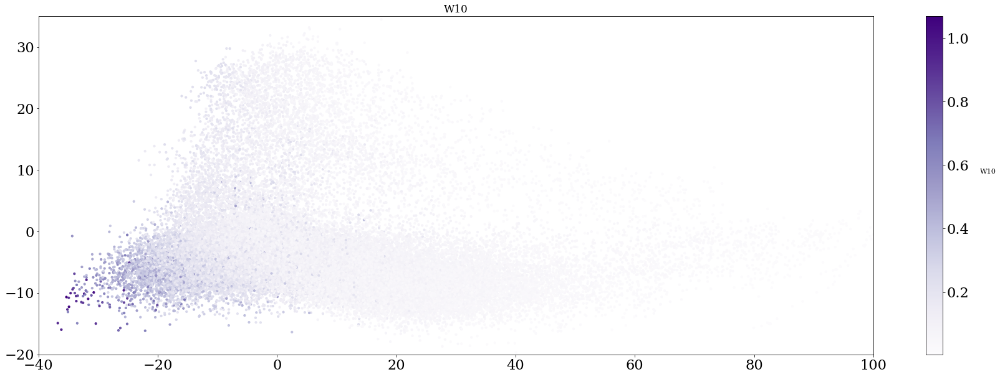

In [86]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_10, cmap="Purples", s=10.0)
ax.set_title("W10", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W10", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_10)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_10)[0])

In [ ]:
quintiles = np.percentile(W_10, [20,40,60,80])
out = np.searchsorted(quintiles,W_10)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W10 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.6512041224828644
0.0030481209761833977


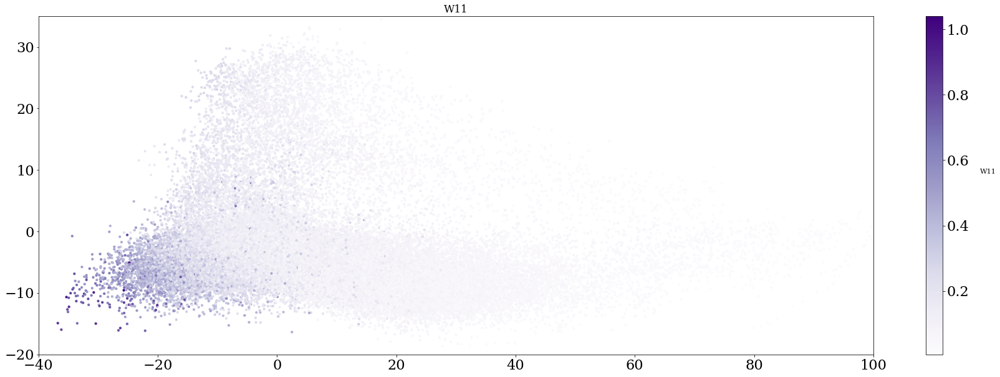

In [87]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_11, cmap="Purples", s=10.0)
ax.set_title("W11", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W11", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_11)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_11)[0])

In [ ]:
quintiles = np.percentile(W_11, [20,40,60,80])
out = np.searchsorted(quintiles,W_11)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W11 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.6725575824383302
0.03173924037651108


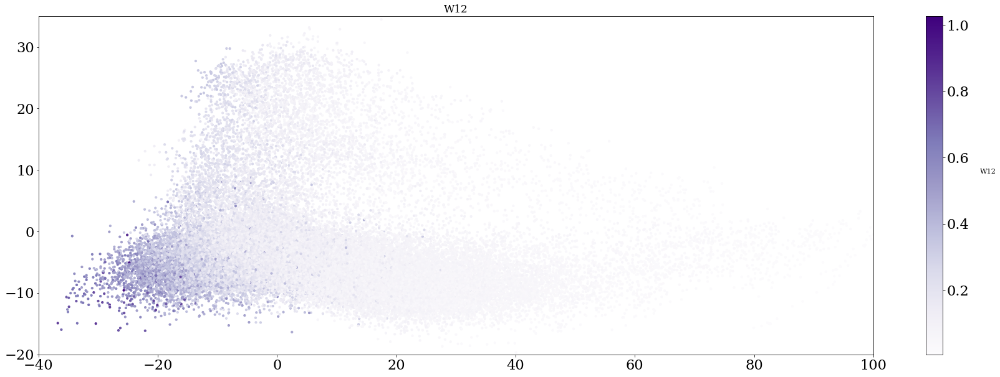

In [88]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_12, cmap="Purples", s=10.0)
ax.set_title("W12", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W12", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_12)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_12)[0])

In [ ]:
quintiles = np.percentile(W_12, [20,40,60,80])
out = np.searchsorted(quintiles,W_12)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W12 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.685690391238956
0.12345294327514664


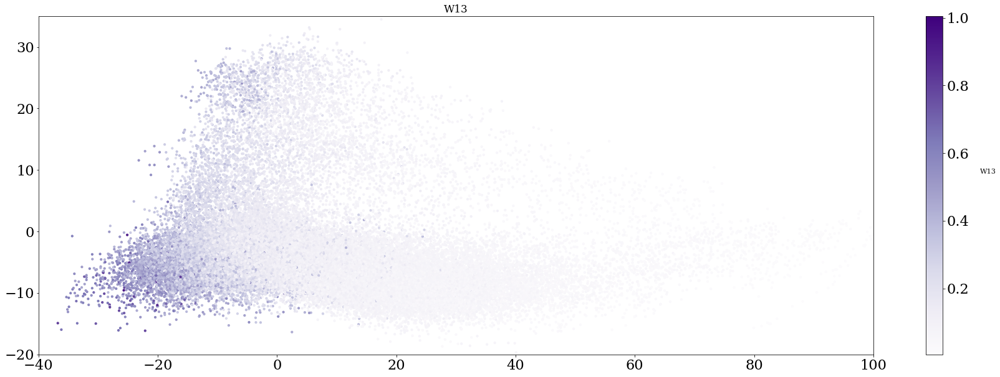

In [89]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_13, cmap="Purples", s=10.0)
ax.set_title("W13", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W13", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_13)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_13)[0])

In [ ]:
quintiles = np.percentile(W_13, [20,40,60,80])
out = np.searchsorted(quintiles,W_13)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W13 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.6723320058723912
0.1576537350124555


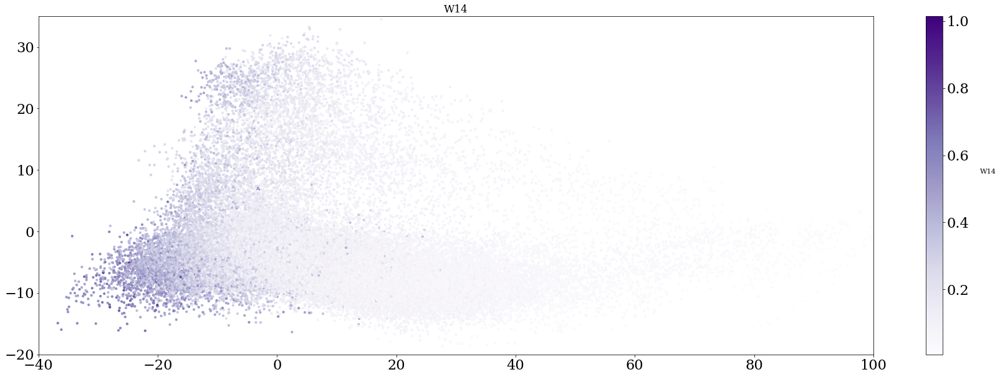

In [90]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_14, cmap="Purples", s=10.0)
ax.set_title("W14", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W14", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_14)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_14)[0])

In [ ]:
quintiles = np.percentile(W_14, [20,40,60,80])
out = np.searchsorted(quintiles,W_14)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W14 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.6539390854407371
0.14541908646332535


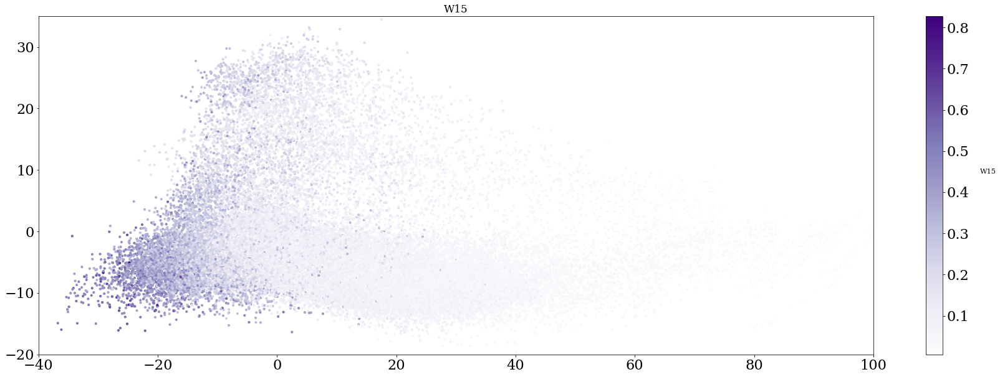

In [91]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_15, cmap="Purples", s=10.0)
ax.set_title("W15", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W15", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_15)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_15)[0])

In [ ]:
quintiles = np.percentile(W_15, [20,40,60,80])
out = np.searchsorted(quintiles,W_15)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W15 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.6560370036445753
0.15187368476554644


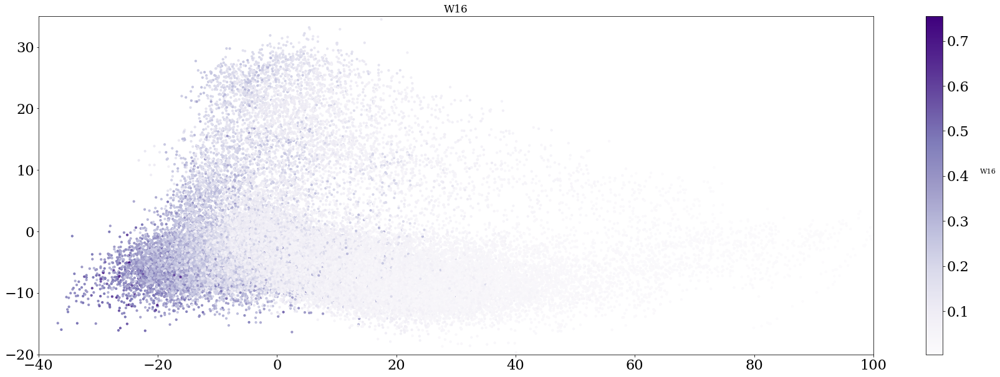

In [92]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_16, cmap="Purples", s=10.0)
ax.set_title("W16", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W16", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_16)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_16)[0])

In [ ]:
quintiles = np.percentile(W_16, [20,40,60,80])
out = np.searchsorted(quintiles,W_16)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W16 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.6533800453120605
0.1703799478520154


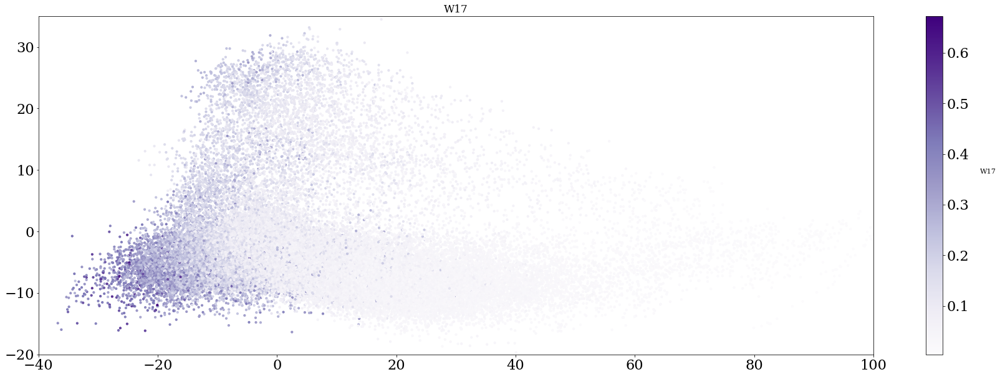

In [93]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_17, cmap="Purples", s=10.0)
ax.set_title("W17", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W17", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_17)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_17)[0])

In [ ]:
quintiles = np.percentile(W_17, [20,40,60,80])
out = np.searchsorted(quintiles,W_17)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W17 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.6449967955490509
0.1657380625528906


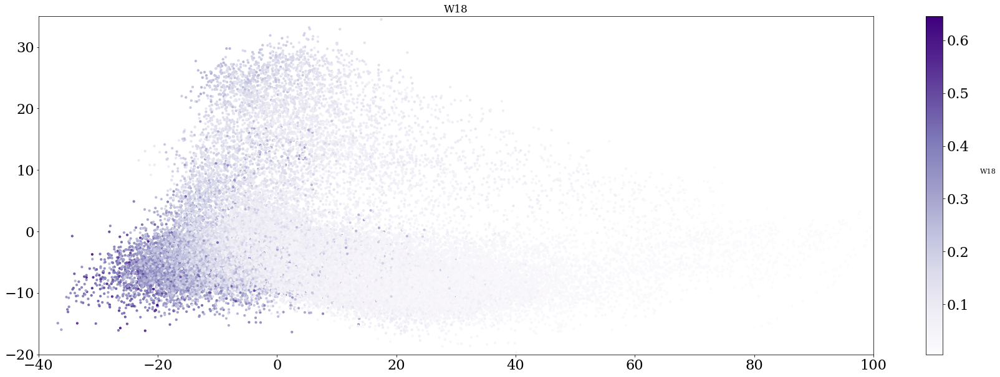

In [94]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_18, cmap="Purples", s=10.0)
ax.set_title("W18", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W18", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_18)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_18)[0])

In [ ]:
quintiles = np.percentile(W_18, [20,40,60,80])
out = np.searchsorted(quintiles,W_18)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W18 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.6441603293466934
0.1711407253730718


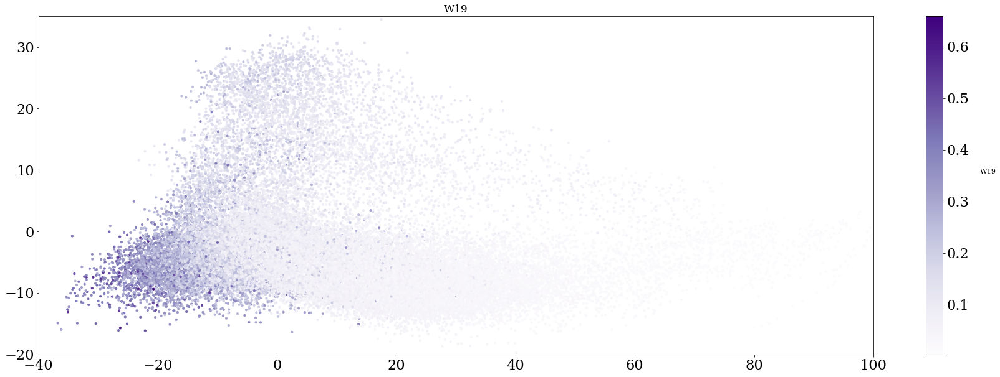

In [95]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_19, cmap="Purples", s=10.0)
ax.set_title("W19", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W19", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_19)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_19)[0])

In [ ]:
quintiles = np.percentile(W_19, [20,40,60,80])
out = np.searchsorted(quintiles,W_19)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W19 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.6392919958874216
0.21739493000791377


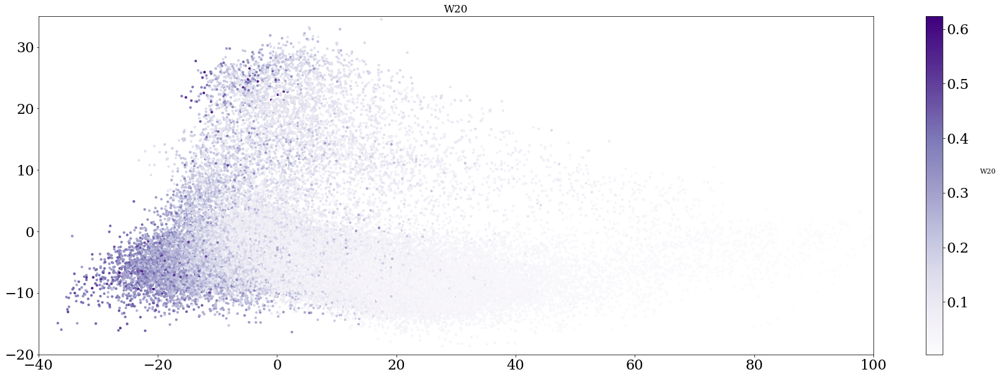

In [96]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_20, cmap="Purples", s=10.0)
ax.set_title("W20", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W20", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_20)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_20)[0])

In [ ]:
quintiles = np.percentile(W_20, [20,40,60,80])
out = np.searchsorted(quintiles,W_20)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W20 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.5641577467289035
0.40092313454748013


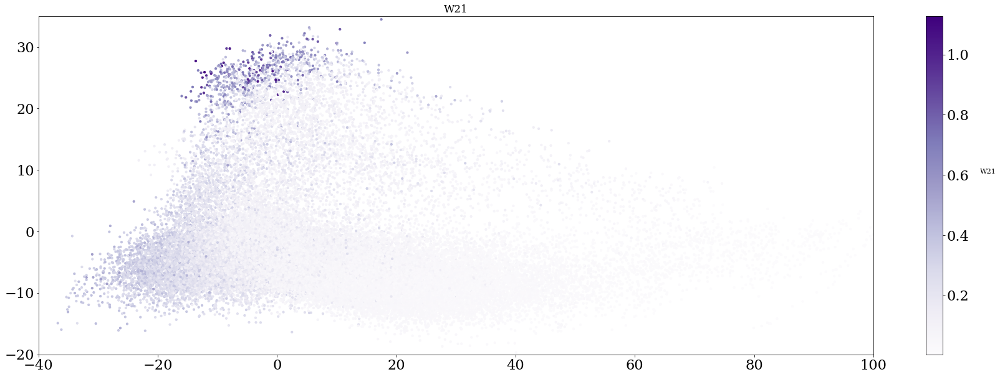

In [97]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_21, cmap="Purples", s=10.0)
ax.set_title("W21", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W21", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_21)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_21)[0])

In [ ]:
quintiles = np.percentile(W_21, [20,40,60,80])
out = np.searchsorted(quintiles,W_21)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W21 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.4664443895739388
0.5901487686524594


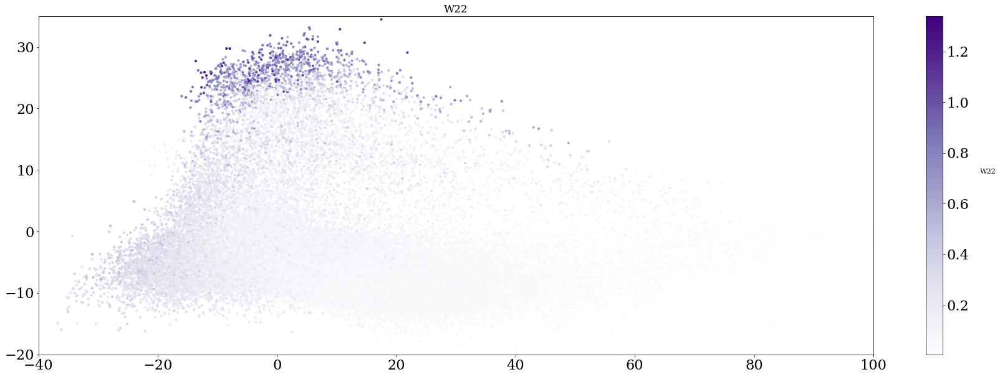

In [98]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_22, cmap="Purples", s=10.0)
ax.set_title("W22", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W22", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_22)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_22)[0])

In [ ]:
quintiles = np.percentile(W_22, [20,40,60,80])
out = np.searchsorted(quintiles,W_22)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W22 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.4062174792669392
0.7255059045073877


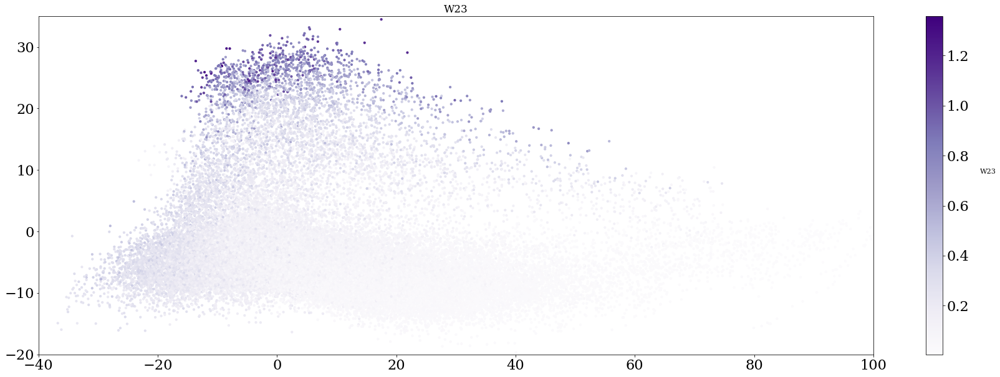

In [99]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_23, cmap="Purples", s=10.0)
ax.set_title("W23", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W23", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_23)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_23)[0])

In [ ]:
quintiles = np.percentile(W_23, [20,40,60,80])
out = np.searchsorted(quintiles,W_23)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W23 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.33771799182421675
0.8342248550325072


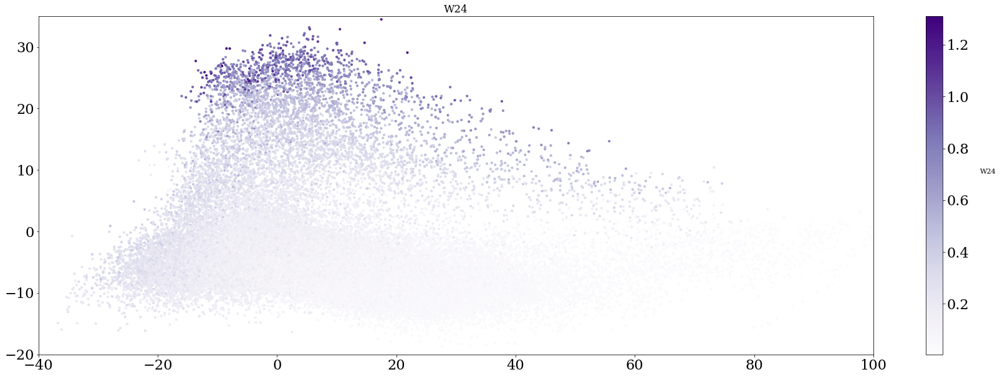

In [100]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_24, cmap="Purples", s=10.0)
ax.set_title("W24", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W24", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_24)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_24)[0])

In [ ]:
quintiles = np.percentile(W_24, [20,40,60,80])
out = np.searchsorted(quintiles,W_24)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W24 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.2723957173253379
0.8787225685248775


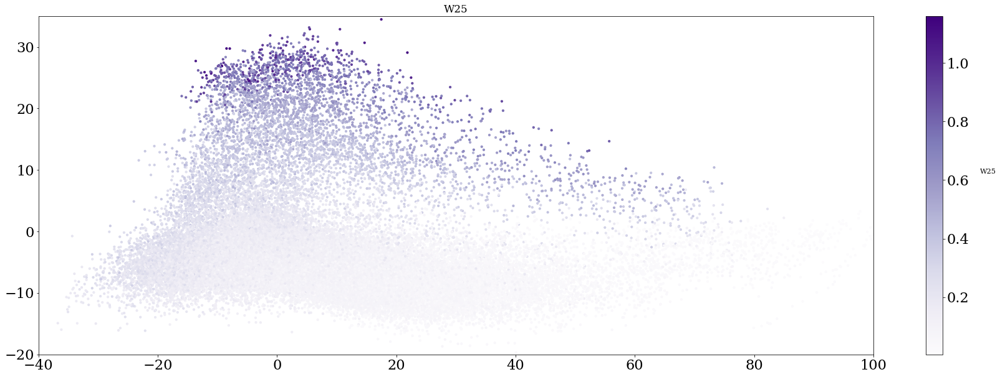

In [101]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_25, cmap="Purples", s=10.0)
ax.set_title("W25", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W25", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_25)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_25)[0])

In [ ]:
quintiles = np.percentile(W_25, [20,40,60,80])
out = np.searchsorted(quintiles,W_25)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W25 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.2138570153532921
0.8799393327738538


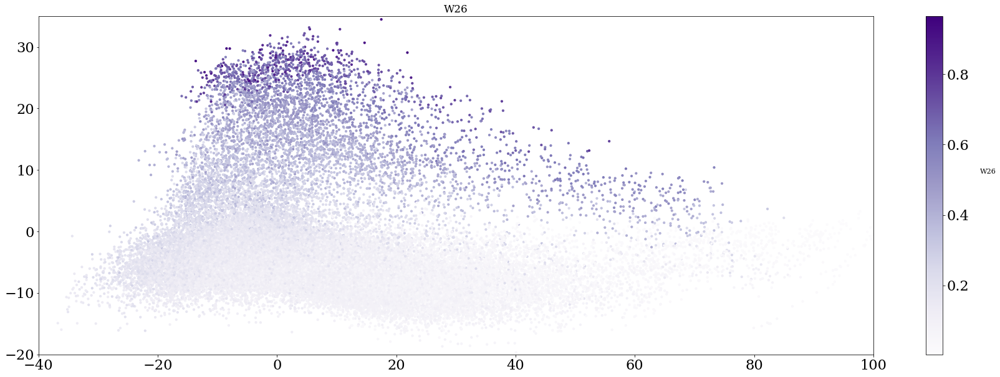

In [102]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_26, cmap="Purples", s=10.0)
ax.set_title("W26", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W26", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_26)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_26)[0])

In [ ]:
quintiles = np.percentile(W_26, [20,40,60,80])
out = np.searchsorted(quintiles,W_26)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W26 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.16658247369668944
0.8710552285944424


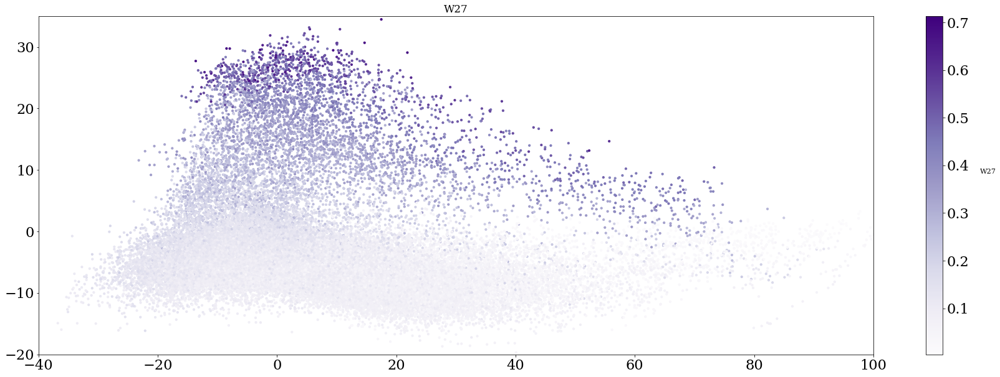

In [103]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_27, cmap="Purples", s=10.0)
ax.set_title("W27", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W27", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_27)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_27)[0])

In [ ]:
quintiles = np.percentile(W_27, [20,40,60,80])
out = np.searchsorted(quintiles,W_27)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W27 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

-0.13097685614176788
0.8640497867755108


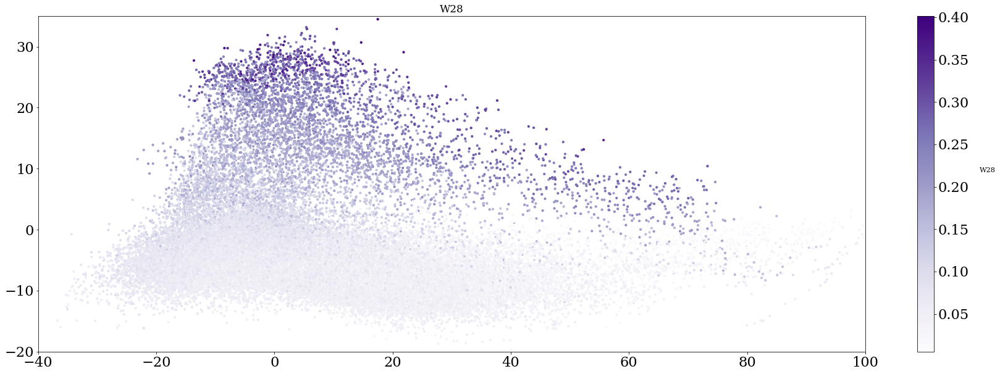

In [104]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_28, cmap="Purples", s=10.0)
ax.set_title("W28", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W28", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_28)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_28)[0])

In [ ]:
quintiles = np.percentile(W_28, [20,40,60,80])
out = np.searchsorted(quintiles,W_28)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W28 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])

nan
nan


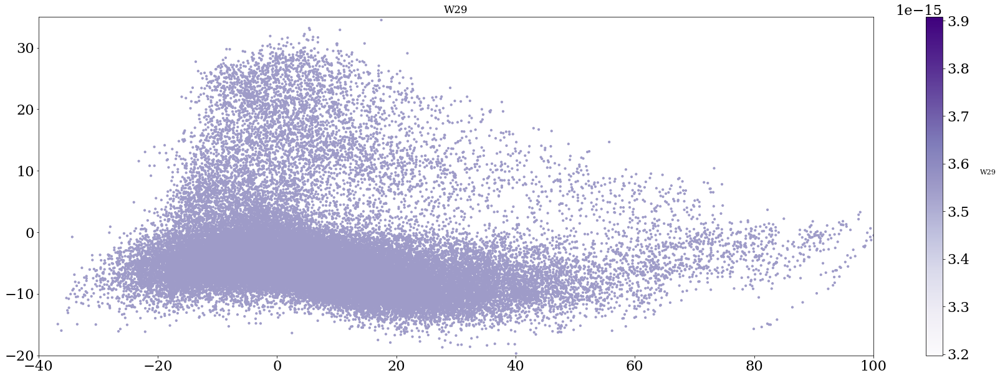

In [105]:
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=W_29, cmap="Purples", s=10.0)
ax.set_title("W29", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="W29", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], W_29)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], W_29)[0])

In [ ]:
quintiles = np.percentile(W_29, [20,40,60,80])
out = np.searchsorted(quintiles,W_29)

cmap = matplotlib.colors.ListedColormap(["pink", "green", "blue","red","black"])
fig, ax = plt.subplots(figsize=(30,10))

cp = ax.scatter(x=z_test_tsne_track[:, 0], y=z_test_tsne_track[:, 1], c=out, cmap=cmap, s=10.0)
ax.set_title("W29 Labeling", fontsize = fz*0.75)
ax.set_xlim(-40,100)
ax.set_ylim(-20,35)
cbar = fig.colorbar(cp)
cbar.set_label(label="Percentiles", rotation="horizontal", fontsize=fz*0.5, labelpad=30, y = 0.55)
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["0","20","40","60","80"])

print(scipy.stats.pearsonr(z_test_tsne_track[:, 0], out)[0])
print(scipy.stats.pearsonr(z_test_tsne_track[:, 1], out)[0])